In [113]:
# General Imports:
import numpy as np
import os
import torch
from time import time
from torch.autograd import Variable
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
import sys
sys.path.append('../')

# Module specific imports from source folder:
from src.tilenet import make_tilenet
from src.resnet import ResNet18
from src.geonet import *

%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


# Analyzing Satellite Data with k-means

This notebook shows how within the tile2vec framework, satellite images can be clustered into different groups. 

# Getting tiles from google earth .png pictures

For this we use the code in the notebook imagery_download.ipynb. We assume the picture files to be saved as png files in the data directory under the res17 folder. 
Bevor we can use the satellite data, it has to be converted to tiles. The following code does that for us

In [128]:
img_dir = 'data/res17'  # directory where images are saved
tile_dir = 'data/res17_tiles'  # where you want to save your tiles
tiles_per_img = 5    # important hyper parameter!
tile_size=320, # Hyperparameter!
tiles = get_tile_png(tile_dir, 
                     img_dir, 
                     tiles_per_img,
                     tile_size, 
                     val_type='uint8', 
                     bands_only=False, 
                     verbose=False)

Visualization of one of the sampled tiles: 

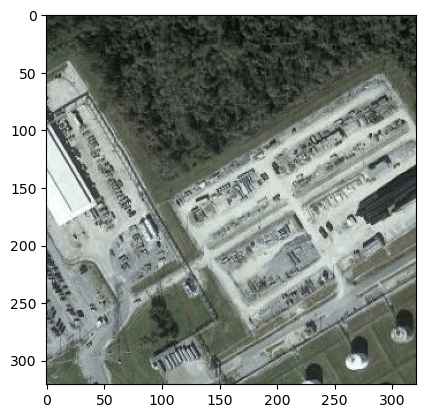

In [129]:
i = 18
tile = np.load(os.path.join(tile_dir, str(i) + '_tile1.npy'))
plt.figure()
plt.imshow(tile[:, :, :3])
plt.show()

# Embedding Tiles

We have now tiles, that are ready for further downstream processing. The tiles are mirrored if they touch the boundary of the original png, which makes them sometimes look strange. Also, the google watermark at the bottom of the pictures is cut out. The next step is, to embed the tiles with our pretrained tile2vec neural network. 

In [116]:
# --------------------
# Loading Pre-trained Model
# --------------------
# Setting up model
in_channels = 4
z_dim = 2048
cuda = torch.cuda.is_available()
# tilenet = make_tilenet(in_channels=in_channels, z_dim=z_dim)
# Use old model for now
tilenet = ResNet18()
if cuda:
    tilenet.cuda()

# Load parameters
model_fn = 'models/naip_trained.ckpt'
checkpoint = torch.load(model_fn, map_location=torch.device('cpu'))
tilenet.load_state_dict(checkpoint)
tilenet.eval()

ResNet(
  (conv1): Conv2d(4, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv3): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (bn3): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (shortcut): Sequential()
    )
    (1): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_

after we loaded the pretrained weights and the network architecture, we can now embed the tiles we just sampled as tiles. If needed, change the tile_dir folder path and also the number of tiles.  

In [77]:
# --------------------
# Embed Tiles
# --------------------
# Get data
tile_dir = 'data/res17_tiles'
n_tiles = len(os.listdir(tile_dir))  # 404

# Embed tiles
t0 = time()
X = np.zeros((n_tiles, z_dim))
    
# for idx in range(n_tiles):
for idx, img_name in enumerate(os.listdir(tile_dir)[:n_tiles]):
    if img_name.endswith('.npy'):
        tile = np.load(os.path.join(tile_dir, img_name), allow_pickle=True)
        tile = tile[:, :, :4]
        tile = np.moveaxis(tile, -1, 0)     # Rearrange to PyTorch order
        tile = np.expand_dims(tile, axis=0)
        tile = tile / 255    # Scale to [0, 1]
    
        tile = torch.from_numpy(tile).float()   # Convert to PyTorch tensor
        tile = Variable(tile)  # Convert to PyTorch variable
        if cuda:
            tile = tile.cuda()
        z = tilenet.encode(tile)   # Get embedding
        if cuda:
            z = z.cpu()
        z = z.data.numpy()
        X[idx, :] = z
t1 = time()
print('Embedded {} tiles: {:0.3f}s'.format(n_tiles, t1-t0))

Embedded 2016 tiles: 123.869s


# Training k-means

In [119]:
# --------------------
# k-means clustering
# --------------------
kmeans = KMeans(n_clusters = 3)  # important hyperparameter!!!
cluster_assignments = kmeans.fit_predict(X)

classes = []
for idx, img_name in enumerate(os.listdir(tile_dir)[:n_tiles]):
    tile_file_name = os.listdir(tile_dir)[idx]
    tile_idx = tile_file_name.split('_')[0]
    classes.append([tile_idx, cluster_assignments[idx]])
np.save(os.path.join('data', 'class_assignments.npy'), classes)

/Users/leonpaletta/miniconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


In [120]:
print(classes[:5])

[['184', 1], ['788', 1], ['651', 1], ['173', 2], ['459', 3]]


In [ ]:
n_img_class = 5     # for how many images you like to know the class
n_img = len(os.listdir(img_dir)) - 1   # how many png satellite images we have
group_and_display(classes, tiles_per_img, img_dir, n_img_class)


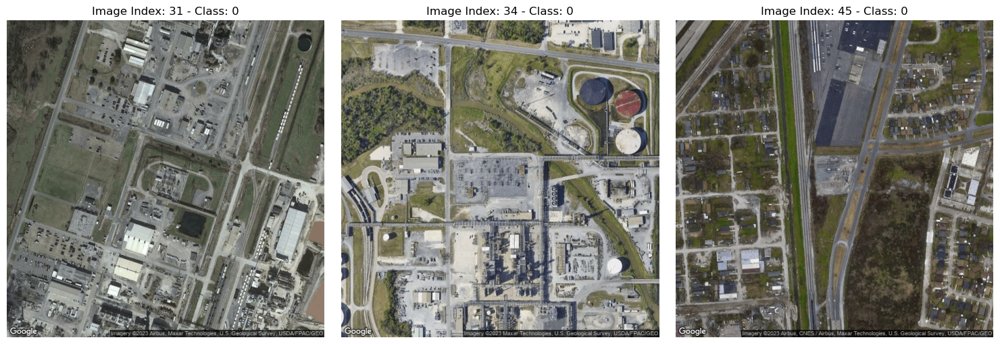

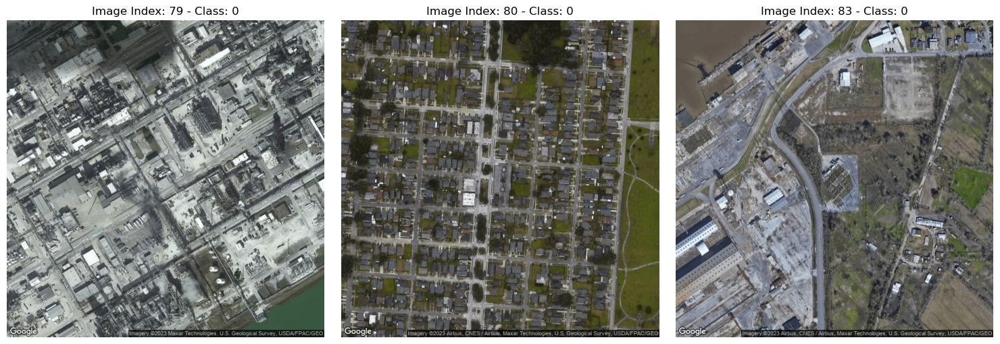

In [123]:
filter_and_plot_pure_classes(classes, img_dir, cat=0, n=6)

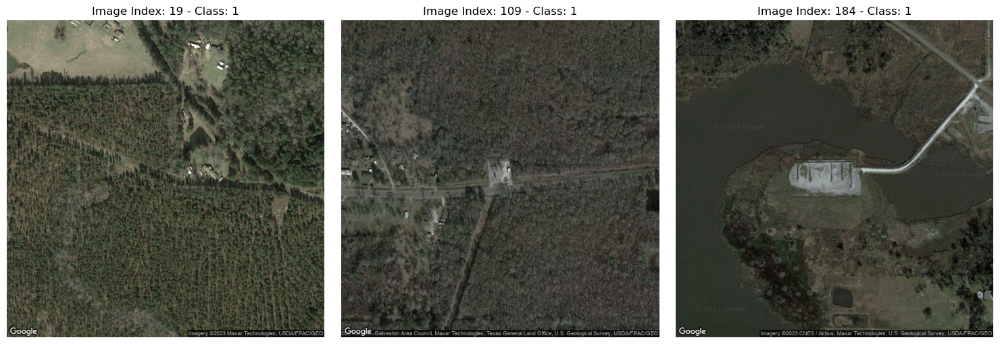

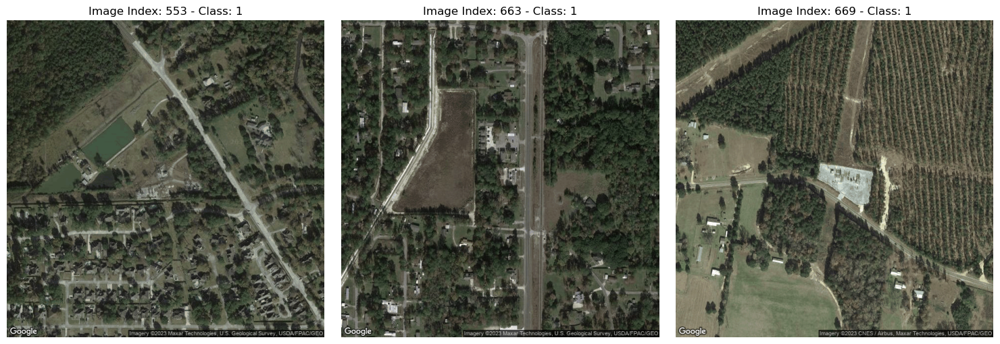

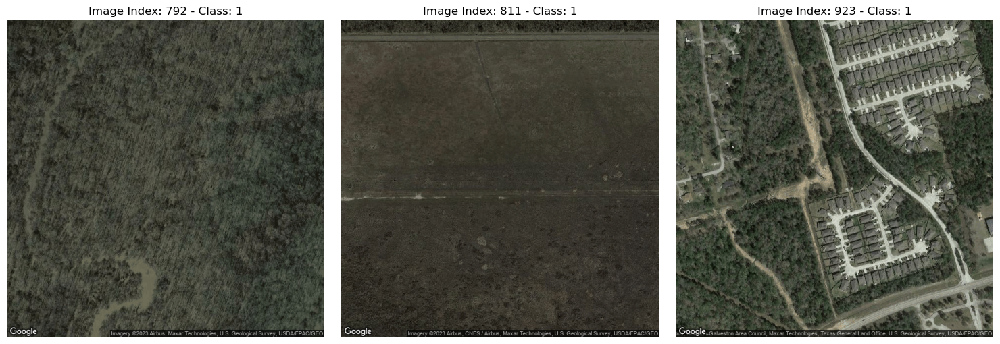

In [124]:
filter_and_plot_pure_classes(classes, img_dir, cat=1, n=9)

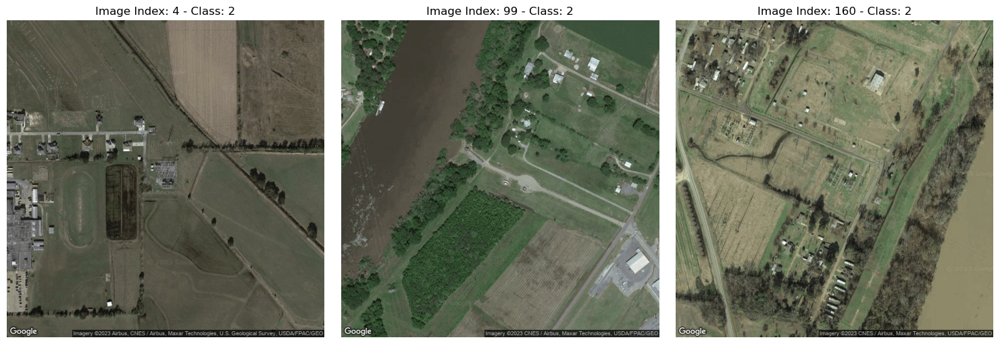

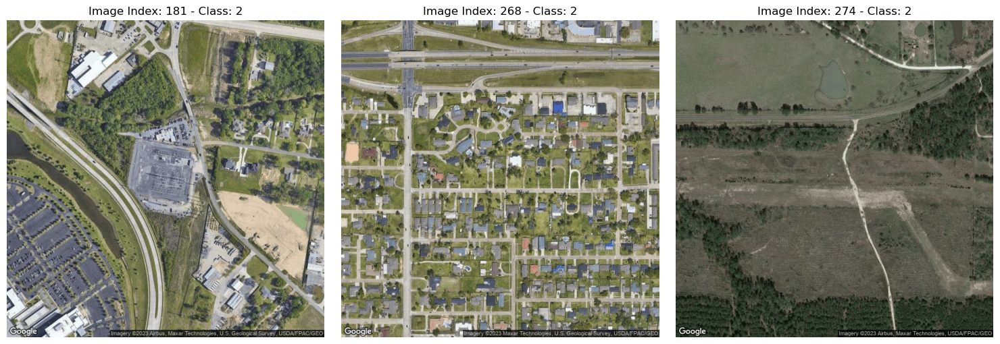

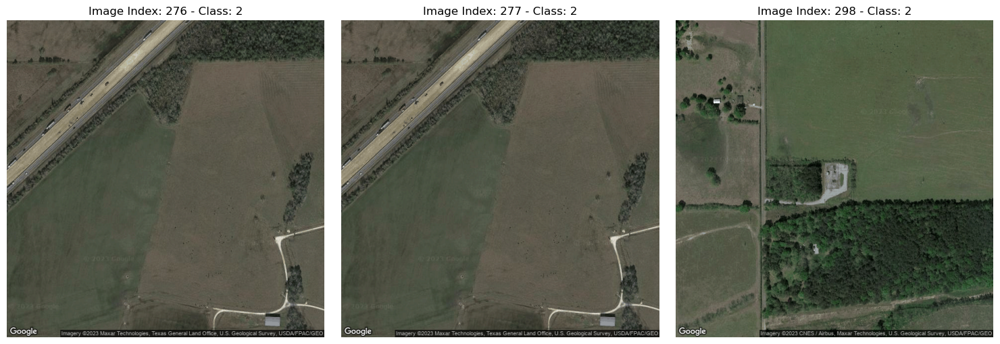

In [125]:
filter_and_plot_pure_classes(classes, img_dir, cat=2, n=9)

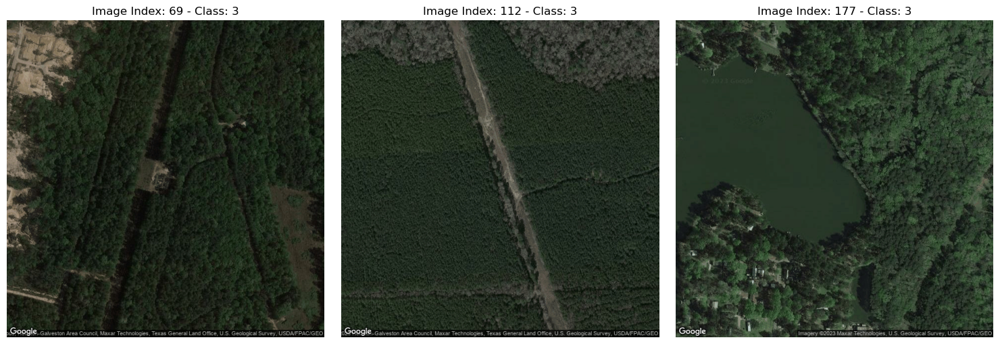

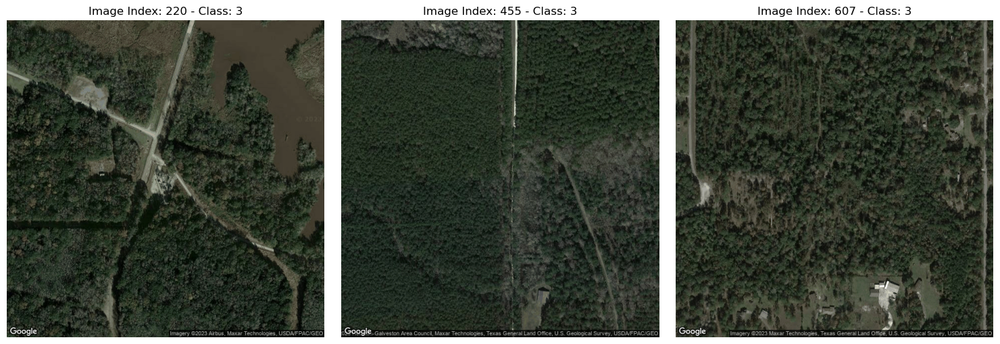

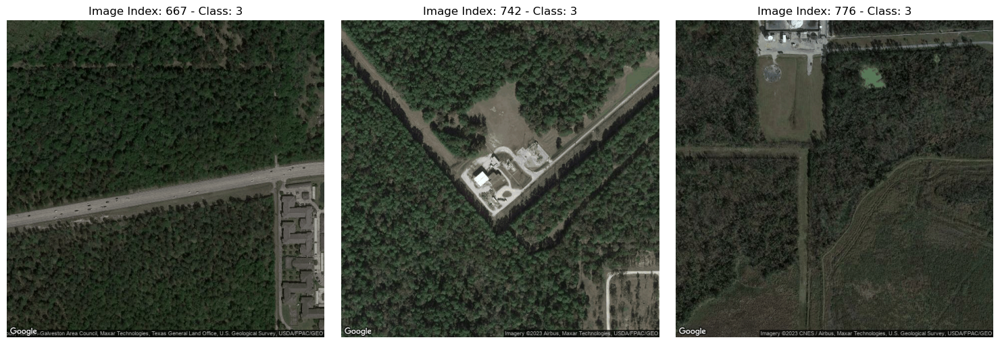

In [126]:
filter_and_plot_pure_classes(classes, img_dir, cat=3, n=9)